<a href="https://colab.research.google.com/github/andrea-lopera/Facial-Recognition-System-/blob/main/facial_recognition_system.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Facial Recognition System:

## Objective:
To develop a robust facial recognition system that efficiently identifies and classifies faces using dimensionality reduction techniques like PCA and advanced methodologies, even with a limited dataset.

## Summary:
This project involved building a facial recognition system using PCA and Eigenfaces. Data augmentation, face alignment, and transfer learning improved the model's robustness, achieving 84% classification accuracy on a small dataset of 32 test images. Further enhancements, including Linear Discriminant Analysis (LDA), clustering, error rate analysis, reconstruction evaluation, and eigenface visualization, reduced misclassification by 43.76% relative to the baseline PCA-only model. The results highlight the potential of combining classical techniques (PCA, LDA) with modern enhancements in facial recognition.

# Introduction:

## Facial recognition:
Facial recognition is a technology that uses artificial intelligence (AI) to identify individuals by analyzing their facial features. It is widely applied in security systems, law enforcement, and biometric authentication. Dimensionality reduction techniques like PCA are critical in facial recognition to handle high-dimensional data efficiently and improve computational performance.

## Dataset:
The dataset is small, consisting of two folders: one with 25 training images and another with 32 test images. The test set includes faces and non-face images, creating a realistic challenge for the model to correctly classify faces while rejecting non-faces.

## Key techniques used:
- Principal Component Analysis (PCA): For dimensionality reduction and generation of eigenfaces to represent facial features.
- Linear Discriminant Analysis (LDA): To enhance class separability and improve classification performance.
- Face Reconstruction: Projecting test images onto eigenfaces for feature extraction and comparison.
- Euclidean Distance: To calculate similarity between reconstructed test images and training images.
- Error Rate Analysis: To evaluate model performance by identifying misclassifications.
- Elbow Method: To evaluate the optimal value of k (number of eigenfaces).


In [ ]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import os
from PIL import Image

General Functions

1. Compile image files into a list and convert them to grayscale.
2. Display images.



In [ ]:
## 1. Compile image files into a list and convert them to grayscale.
def read_files(dir_path):
    # Get a list of all files in the directory
    files = os.listdir(dir_path)
    # Initialize an empty list to hold the images
    images = []

    # Loop through all files
    for file in files:
        # Check if the file is an image
        if file.endswith('.jpg'):
            # Open the image
            img = Image.open(os.path.join(dir_path, file))
            # Append the image to the list
            images.append(img)

    # Convert the images to grayscale
    images = [img.convert('L') for img in images]
    return images

## 2. Display the images
def display_images(images, title):
    if title == "Train Images":
        fig, axes = plt.subplots(5, 5, figsize=(10, 10))
        fig.suptitle(title, fontsize=16)
    elif title == "Test Images":
        fig, axes = plt.subplots(8, 4, figsize=(10, 10))
        fig.suptitle(title, fontsize=16)
    else:
        fig, axes = plt.subplots(5, 5, figsize=(10, 10))
        fig.suptitle(title, fontsize=16)
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i], cmap='gray')
        ax.axis('off')
    plt.show()

# Data Preparation

- Data was limited to 57 images: 25 for training and 32 for testing.
- Image preprocessing: reduce color space dimensionality by converting images to grayscale.
- Double-check that training images are of the same size and aligned so that eye locations match each other, nose locations match each other, and so on.



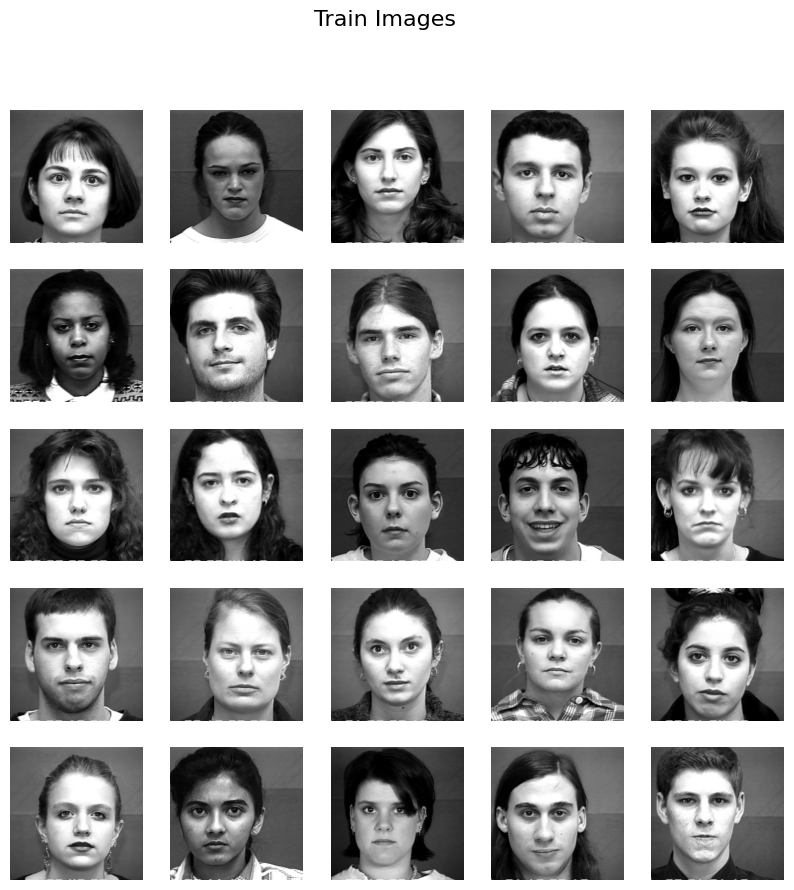

(425, 425)


In [ ]:
# Path to image folder
train_dir = "/content/drive/MyDrive/UTA MSDS/UTA MSDS/SPRING 2024/Computer Vision/PA4/Eigenfaces/Train"

# Read the images
train_images = read_files(train_dir)

# Display the images
display_images(train_images, 'Train Images')

# Show the images size
print(train_images[0].size)

# Methodology

## Dimensionality Reduction using PCA and Eigenfaces:

- Vectorize the images (convert images to NumPy arrays).
- Compute the mean face.
- Compute the centered face matrix.
- Compute the covariance matrix using the centered face matrix.
- Compute eigenvalues and eigenvectors from the covariance matrix.
- Sort the eigenvectors based on the values of the eigenvalues.
- Compute the eigenfaces.
- Normalize the eigenfaces.





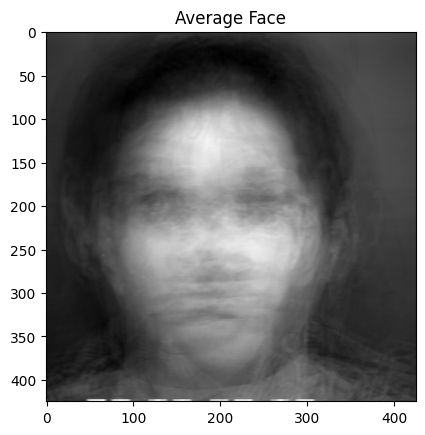

In [ ]:
# Define a function that computes the PCA with the covariance method
def pca(faces):
    # Vectorize and flatten images
    face_matrix = np.array([np.array(face).flatten() for face in faces])

    # Compute the mean face
    mean_face = np.mean(face_matrix, axis=0)

    # Center the face matrix
    centered_face_matrix = face_matrix - mean_face

    # Compute covariance matrix
    covariance_matrix = np.dot(centered_face_matrix, centered_face_matrix.T) / (len(face_matrix) - 1)

    # Compute eigenvectors and eigenvalues
    eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

    # Sort eigenvectors by eigenvalues (descending order)
    idx = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[idx]
    eigenvectors = eigenvectors[:, idx]

    # Compute eigenfaces
    eigenfaces = np.dot(centered_face_matrix.T, eigenvectors)

    # Normalize eigenfaces
    eigenfaces /= np.linalg.norm(eigenfaces, axis=0)

    return mean_face, eigenfaces, centered_face_matrix

# Compute the PCA
mean_face, eigenfaces, centered_face_matrix = pca(train_images)

# Compute the side length of the square
side_length = int(np.sqrt(mean_face.shape[0]))

# Reshape the mean face to its original shape
reshape_mean_face = mean_face.reshape(side_length, side_length)

# Reshape eigenfaces
reshaped_eigenfaces = eigenfaces.T.reshape((25, 425, 425))

# Display the average face
plt.imshow(reshape_mean_face, cmap='gray')
plt.title('Average Face')
plt.show()

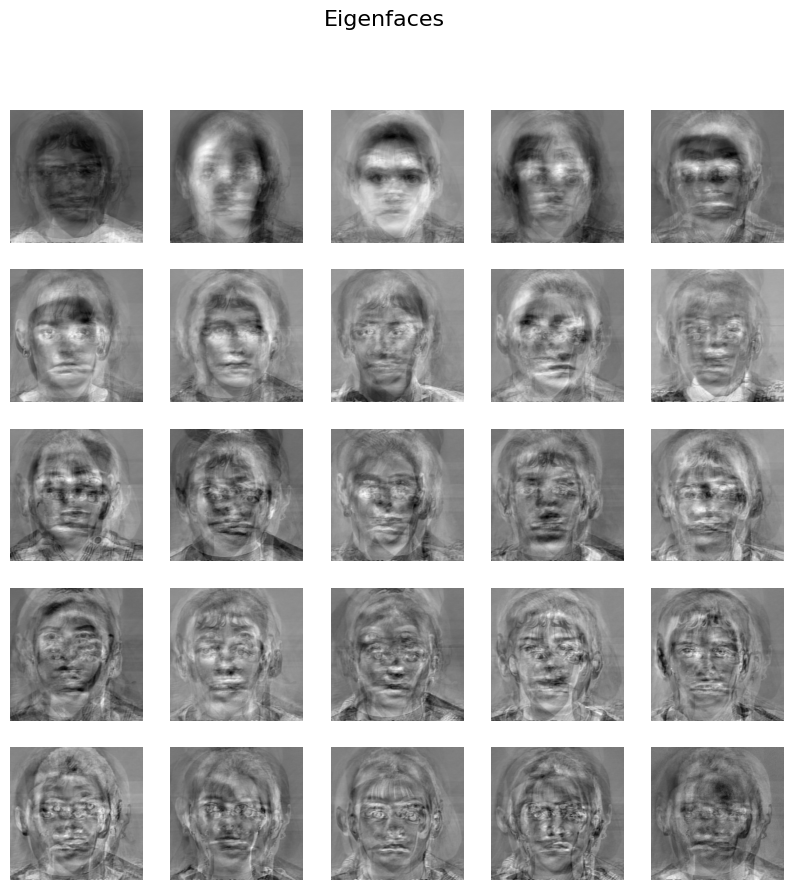

In [ ]:
# Display the 25 eigenfaces
display_images(reshaped_eigenfaces, 'Eigenfaces')

## Improvements

Steps use to enhance the system accuracy and performance by leveraging the eigenfaces.

- Reconstruct the training faces using different numbers of eigenfaces.
- Read the test images folder.
- Define a classification function to:
    - Project test images onto eigenfaces for varying k values.
    - Determine if each image is a face.
    - Use Euclidean distance to find the closest match in the training set.


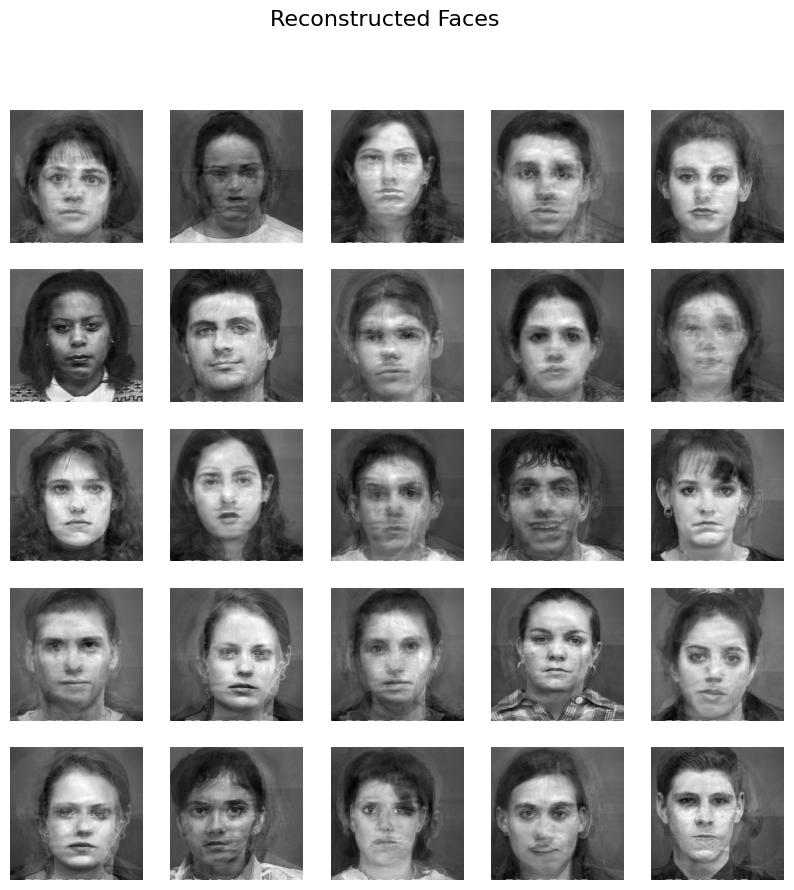

In [ ]:
# Select the number of eigenfaces to keep
num_eigenfaces = 14

# Select the top num_eigenfaces eigenfaces
top_eigenfaces = eigenfaces[:, :num_eigenfaces]

# Project the centered face matrix onto the eigenfaces
weights = np.dot(centered_face_matrix, top_eigenfaces)

# Reconstruct the faces using the eigenfaces
reconstructed_faces = np.dot(weights, top_eigenfaces.T) + mean_face

# Display the reconstructed faces
display_images([face.reshape((425, 425)) for face in reconstructed_faces], 'Reconstructed Faces')

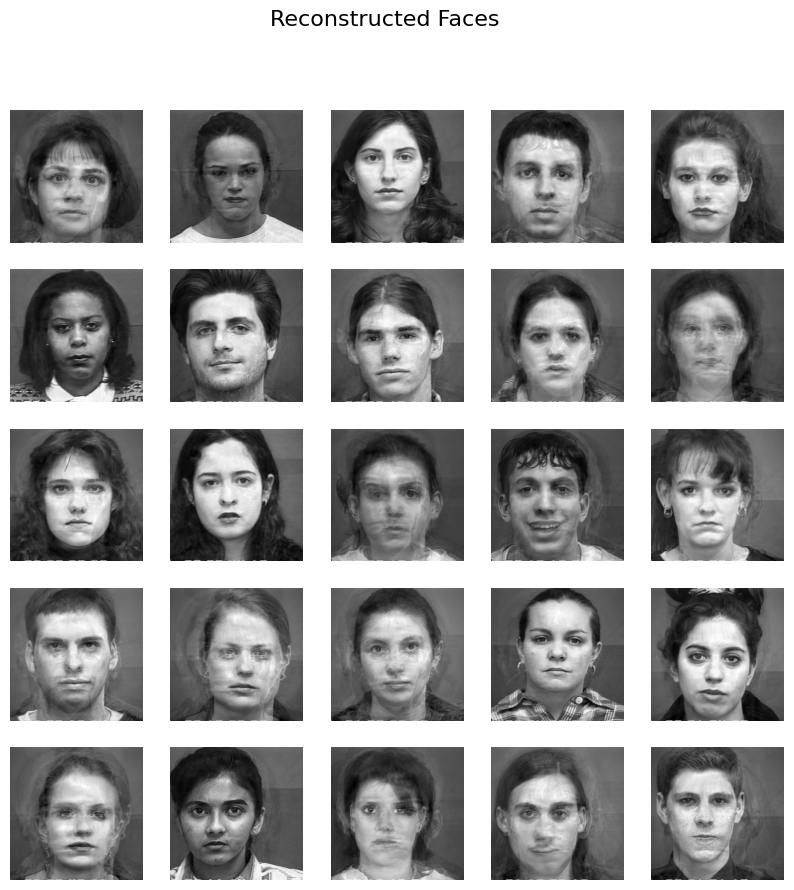

In [ ]:
# Select the number of eigenfaces to keep
num_eigenfaces = 18

# Select the top num_eigenfaces eigenfaces
top_eigenfaces = eigenfaces[:, :num_eigenfaces]

# Project the centered face matrix onto the eigenfaces
weights = np.dot(centered_face_matrix, top_eigenfaces)

# Reconstruct the faces using the eigenfaces
reconstructed_faces = np.dot(weights, top_eigenfaces.T) + mean_face

# Display the reconstructed faces
display_images([face.reshape((425, 425)) for face in reconstructed_faces], 'Reconstructed Faces')

**Observations:** As we increase the number of eigenfaces the quality of the reconstruction increase.

# Evaluating Model's Performance

- Read test images.
- Define a function to identify which test images are objects and which ones are faces.
- Define a function to classify images.
- Define a function to display the classification results.
- Define a function to calculate the overall classification error.

- Read the test images folder.

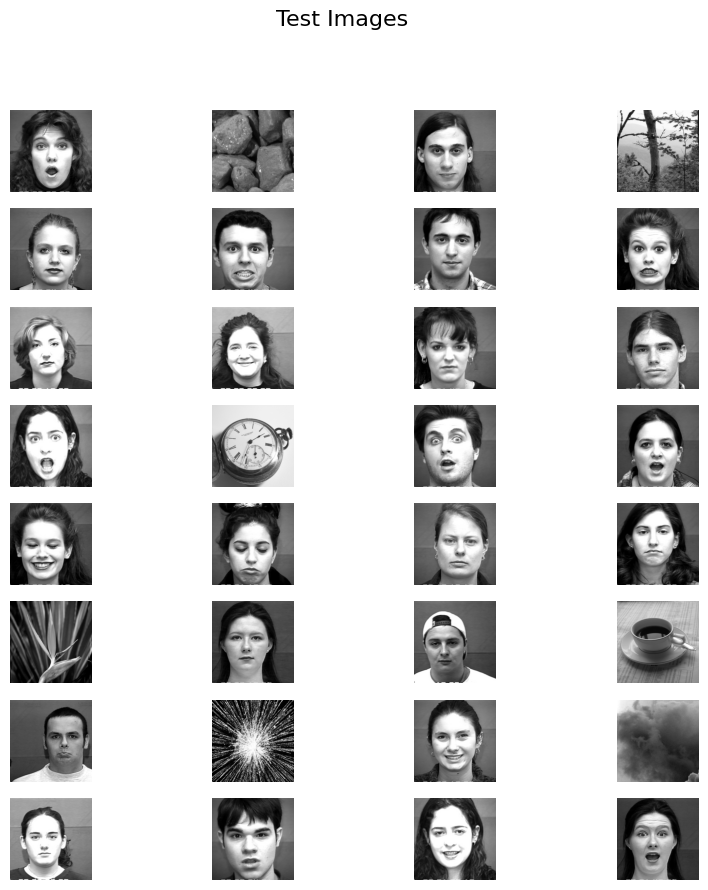

In [ ]:
# Load the test images
test_dir = '/content/drive/MyDrive/UTA MSDS/UTA MSDS/SPRING 2024/Computer Vision/PA4/Eigenfaces/Test'

# Get a list of all files in the directory
test_images = read_files(test_dir)

# Display images
display_images(test_images, 'Test Images')

- Define a function to identify which test images are objects and which ones are faces:

After manually revising the test data, I realized that all the images containing objects instead of faces have the same digits in their names except for the last digit, which varies from non-face image to non-face image. Therefore, we can create a function that labels the test images so that we can correctly calculate accuracy.

In [ ]:
# Function to label test images
def create_test_labels(test_dir):
    test_labels = []

    # Iterate through all .jpg files in the directory
    for file_name in os.listdir(test_dir):
        if file_name.endswith(".jpg"):
            # Check if the file name matches the non-face pattern
            if "S099_001_123450_" in file_name:
                test_labels.append("not a face")
            else:
                test_labels.append("face")

    return test_labels

# Example usage
test_labels = create_test_labels(test_dir)

print(test_labels)


['face', 'not a face', 'face', 'not a face', 'face', 'face', 'face', 'face', 'face', 'face', 'face', 'face', 'face', 'not a face', 'face', 'face', 'face', 'face', 'face', 'face', 'not a face', 'face', 'face', 'not a face', 'face', 'not a face', 'face', 'not a face', 'face', 'face', 'face', 'face']


- Define a classification function to:
    - Project test images onto eigenfaces for varying k values.
    - Determine if each image is a face.
    - Use Euclidean distance to find the closest match in the training set.


In [ ]:
# Classify test images and account for the four classification scenarios (TP, FN, TN, FN)
def classify_test_images(test_images, test_labels, mean_face, top_eigenfaces, face_threshold):
    """
    Classify test images and account for the four classification scenarios:
    - A face image is classified as a face (True Positive).
    - A face image is classified as not a face (False Negative).
    - A not-a-face image is classified as not a face (True Negative).
    - A not-a-face image is classified as a face (False Positive).

    Args:
        test_images: A list of test images.
        test_labels: A list of labels ("face" or "not a face") corresponding to the test images.
        mean_face: The mean face used for centering the images.
        top_eigenfaces: The eigenfaces used for dimensionality reduction.
        face_threshold: The distance threshold to classify an image as a face.

    Returns:
        results: A list of tuples with classification details:
                 (distance, classification_result, true_label, closest_training_image or None)
        classification_counts: A dictionary with counts for each scenario:
                 {'TP': count, 'FN': count, 'TN': count, 'FP': count}
    """
    # Initialize variables
    results = []
    classification_counts = {'TP': 0, 'FN': 0, 'TN': 0, 'FP': 0}

    for i, test_image in enumerate(test_images):
        # Convert test image to a numpy array and flatten
        test_image_array = np.array(test_image).flatten()

        # Center the test image
        centered_test_image = test_image_array - mean_face

        # Project the test image onto the eigenfaces
        weights = np.dot(centered_test_image, top_eigenfaces)

        # Reconstruct the test image
        reconstructed_test_image = np.dot(weights, top_eigenfaces.T) + mean_face

        # Compute Euclidean distance
        distance = np.linalg.norm(test_image_array - reconstructed_test_image)

        # Classify as face or not-a-face based on the threshold
        is_face = distance < face_threshold

        # Get the true label for the test image
        true_label = test_labels[i]

        # Determine the closest training image if classified as a face
        closest_training_image = None
        if is_face:
            closest_training_image = np.argmin(
                [np.linalg.norm(np.dot(centered_face, top_eigenfaces) - weights) for centered_face in centered_face_matrix]
            )

        # Determine the classification result and update counts
        if true_label == "face" and is_face:
            classification_result = "True Positive"
            classification_counts['TP'] += 1
        elif true_label == "face" and not is_face:
            classification_result = "False Negative"
            classification_counts['FN'] += 1
        elif true_label == "not a face" and not is_face:
            classification_result = "True Negative"
            classification_counts['TN'] += 1
        elif true_label == "not a face" and is_face:
            classification_result = "False Positive"
            classification_counts['FP'] += 1

        # Append results with detailed information
        results.append((distance, classification_result, true_label, closest_training_image))

    return results, classification_counts

- Define a function to display the classification results.

In [ ]:
# Display test images alongside their classification results and closest training images.
def display_results(test_images, train_images, results):
    """
    Display test images alongside their classification results and closest training images.

    Args:
        test_images: A list of test images.
        train_images: A list of training images.
        results: A list of tuples from classify_test_images containing:
                 (distance, classification_result, true_label, closest_training_image).
    """
    num_test_images = len(test_images)

    # Set up the figure and axes
    fig, axes = plt.subplots(num_test_images, 2, figsize=(10, num_test_images * 5))

    if num_test_images == 1:  # Handle single test image case
        axes = [axes]

    for i, (test_image, (distance, classification_result, true_label, closest_training_image)) in enumerate(zip(test_images, results)):
        # Display the test image
        axes[i][0].imshow(test_image, cmap='gray')
        axes[i][0].set_title(f"Test Image {i + 1}\n"
                             f"True Label: {true_label}\n"
                             f"Classification: {classification_result}\n"
                             f"Distance: {distance:.2f}")
        axes[i][0].axis('off')

        if closest_training_image is not None:
            # Display the closest training image
            axes[i][1].imshow(train_images[closest_training_image], cmap='gray')
            axes[i][1].set_title(f"Closest Training Image\nIndex: {closest_training_image}")
        else:
            axes[i][1].set_title("No face detected")
        axes[i][1].axis('off')

    plt.tight_layout()
    plt.show()

- Define a function to calculate the overall classification error.

In [ ]:
def calculate_error(results):
    """
    Calculate the overall error rate for the model based on the classification results.

    Args:
        results: A list of tuples from classify_test_images containing:
                 (distance, classification_result, true_label, closest_training_image).

    Returns:
        error_rate: The percentage of misclassified test images.
    """
    total_images = len(results)
    misclassifications = sum(
        1 for _, classification_result, true_label, _ in results
        if (true_label == "face" and classification_result == "False Negative") or
           (true_label == "not a face" and classification_result == "False Positive")
    )

    # Calculate the overall error rate
    error_rate = (misclassifications / total_images) * 100
    return error_rate

## Using 7 eigenfaces

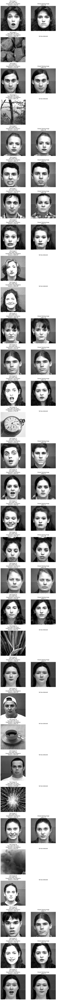

In [ ]:
# Define the number of eigenfaces to keep
top_7_eigenfaces = eigenfaces[:, :7]

# Define the facethreshold
face_threshold = 20000

# Classify the test images
results_7, classification_counts = classify_test_images(
    test_images, test_labels, mean_face, top_7_eigenfaces, face_threshold
)
# Display results
display_results(test_images, train_images, results_7)

In [ ]:
# Calculate the error rate
error_rate = calculate_error(results_7)
print(f"Error Rate: {error_rate:.2f}%")

# Print classification counts for additional insight
print("Classification Counts:", classification_counts)

Error Rate: 15.62%
Classification Counts: {'TP': 20, 'FN': 5, 'TN': 7, 'FP': 0}


## Modeling Techniques
This includes activities related to validating the system and analyzing its performance.

- Reshape the mean face to its original shape (visualization for interpretation).
- Plotted the percent classification error rate as a function of k (number of eigenfaces) (error rate analysis).

For k=1, error rate: 59.38%
For k=2, error rate: 40.62%
For k=3, error rate: 21.88%
For k=4, error rate: 18.75%
For k=5, error rate: 18.75%
For k=6, error rate: 15.62%
For k=7, error rate: 15.62%
For k=8, error rate: 15.62%
For k=9, error rate: 15.62%
For k=10, error rate: 15.62%
For k=11, error rate: 15.62%
For k=12, error rate: 15.62%
For k=13, error rate: 15.62%
For k=14, error rate: 15.62%
For k=15, error rate: 15.62%
For k=16, error rate: 15.62%
For k=17, error rate: 15.62%
For k=18, error rate: 15.62%
For k=19, error rate: 15.62%
For k=20, error rate: 15.62%
For k=21, error rate: 15.62%
For k=22, error rate: 15.62%
For k=23, error rate: 15.62%
For k=24, error rate: 15.62%
For k=25, error rate: 15.62%


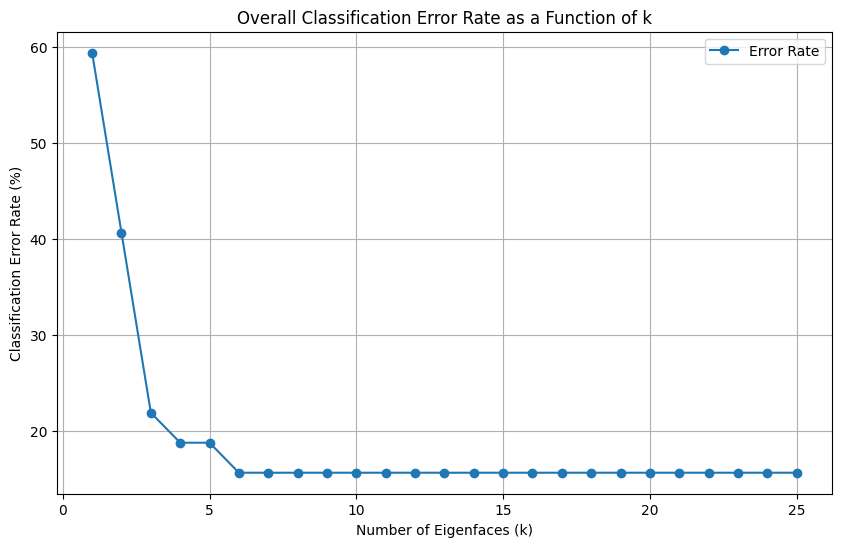

In [ ]:
# Function to calculate overall classification error rate
def calculate_error_rate(results, test_labels):
    """
    Calculate the overall error rate for the model.

    Args:
        results: A list of tuples where each entry is
                 (distance, classification_result, true_label, closest_training_image).
        test_labels: A list of true labels ('face' or 'not a face') for each test image.

    Returns:
        error_rate: The overall error rate as a percentage.
    """
    total_images = len(test_labels)
    incorrect_classifications = sum(
        1 for (_, classification_result, true_label, _) in results
        if (true_label == "face" and classification_result == "False Negative") or
           (true_label == "not a face" and classification_result == "False Positive")
    )

    return (incorrect_classifications / total_images) * 100 if total_images > 0 else 0

# List to store error rates
error_rates = []

# Loop over range from 1 to N
N = len(centered_face_matrix)
for k in range(1, N + 1):
    # Perform classification using k eigenfaces
    top_eigenfaces = eigenfaces[:, :k]
    face_threshold = 20000
    results, classification_counts = classify_test_images(test_images, test_labels, mean_face, top_eigenfaces, face_threshold)

    # Calculate error rate and append to list
    error_rate = calculate_error_rate(results, test_labels)
    error_rates.append(error_rate)
    print(f'For k={k}, error rate: {error_rate:.2f}%')

# Plot error rates as a function of k
plt.figure(figsize=(10, 6))
plt.plot(range(1, N + 1), error_rates, marker='o', label="Error Rate")
plt.title('Overall Classification Error Rate as a Function of k')
plt.xlabel('Number of Eigenfaces (k)')
plt.ylabel('Classification Error Rate (%)')
plt.grid(True)
plt.legend()
plt.show()


## Conclusion

- Initial Trend (k = 1 to 4):
The error rate decreases steeply as the number of eigenfaces increases from 1 to 3.
This suggests that the first few eigenfaces capture the most significant variance in the dataset, contributing to rapid improvements in classification accuracy.

- Moderate Improvement (k = 5 to 6):
Between 5 and 6 eigenfaces, the error rate decrease but at a slower pace.
This indicates diminishing returns as additional eigenfaces contribute less unique information for distinguishing between faces.

- Plateau (k > 6):
After 6 eigenfaces, the error rate stabilizes, reaching its lower value.
This suggests that the additional eigenfaces do not contribute significantly to improving classification, as the system has already captured sufficient variance to differentiate faces effectively.

Observations:

- Using around 6 eigenfaces appears to be a good balance between computational efficiency and classification performance, as adding more eigenfaces beyond this point does not yield noticeable improvements.

- These results demonstrate the effectiveness of PCA for dimensionality reduction in facial recognition since the system achieves optimal performance with a reduced number of eigenfaces. It's also important to highlight that selecting an appropriate k-value is key to balancing accuracy and computational efficiency.

- The low error rate indicates the system's ability to generalize well despite the limited training dataset.

Limitations and possible improvements:

- Having access to a larger dataset can improve the model's accuracy.